## Imports

In [91]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, roc_curve
from pandas_profiling import ProfileReport

In [92]:
df = pd.read_csv('winequality_red.csv')

In [93]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [94]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Splitting df

In [95]:
y = df['quality']
X = df.drop(columns='quality')

In [96]:
X


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [97]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [98]:
# Splitting train/test
X_train, X_test,y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=300)

## Modelling

In [99]:
dt_model = DecisionTreeClassifier()
dt_model.fit(X_train, y_train)

DecisionTreeClassifier()

In [100]:
dt_model.predict(X_test)

array([6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 5, 6, 6, 6, 4, 5, 6, 7,
       6, 5, 7, 7, 5, 5, 7, 5, 6, 7, 6, 5, 5, 5, 5, 4, 5, 5, 5, 5, 6, 5,
       6, 5, 5, 6, 6, 6, 6, 5, 6, 6, 5, 6, 7, 5, 6, 6, 6, 7, 5, 6, 8, 5,
       7, 6, 4, 6, 5, 6, 6, 7, 6, 6, 8, 5, 6, 5, 5, 6, 6, 6, 6, 7, 5, 5,
       6, 4, 6, 5, 5, 7, 5, 4, 7, 6, 5, 5, 7, 5, 6, 6, 5, 7, 5, 5, 5, 7,
       6, 5, 5, 6, 5, 6, 4, 6, 6, 5, 6, 5, 6, 6, 6, 7, 5, 5, 6, 6, 5, 5,
       5, 5, 6, 6, 6, 7, 5, 5, 6, 5, 6, 5, 6, 6, 8, 5, 6, 5, 6, 7, 7, 5,
       4, 6, 6, 6, 6, 8, 5, 5, 6, 6, 5, 6, 6, 5, 6, 6, 7, 5, 6, 6, 6, 7,
       5, 5, 5, 5, 6, 6, 6, 6, 5, 6, 6, 6, 5, 5, 5, 5, 6, 5, 6, 6, 6, 6,
       6, 5, 5, 6, 6, 6, 6, 7, 5, 6, 5, 5, 5, 6, 7, 5, 5, 7, 5, 7, 5, 7,
       5, 5, 5, 5, 5, 7, 5, 5, 5, 5, 6, 6, 5, 7, 6, 5, 6, 5, 6, 6, 5, 6,
       5, 6, 7, 5, 5, 5, 5, 5, 7, 5, 6, 7, 5, 6, 6, 6, 5, 7, 6, 6, 5, 5,
       6, 7, 6, 5, 6, 4, 5, 6, 5, 6, 6, 5, 5, 6, 5, 7, 7, 6, 5, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 6, 6, 7, 6, 6, 7, 5, 6, 5,

In [101]:
# Checking accuracy
dt_model.score(X_test, y_test)

0.621875

In [102]:
dt_en = DecisionTreeClassifier(criterion='entropy')
dt_en.fit(X_train, y_train)
dt_en.score(X_test, y_test)

0.603125

In [103]:
outfile = dot_for_dt_en = open('dt_en_meta.dot', 'w')
tree.export_graphviz(dt_en, out_file=outfile, feature_names=X.columns)

In [104]:
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
import sklearn
warnings.filterwarnings('ignore')

In [105]:
sklearn.__version__

'0.24.2'

[Text(526.7284908786954, 1064.55, 'X[10] <= 10.25\ngini = 0.639\nsamples = 1279\nvalue = [5, 43, 549, 513, 153, 16]'),
 Text(252.72714541295167, 1019.25, 'X[1] <= 0.548\ngini = 0.507\nsamples = 665\nvalue = [3, 22, 417, 208, 14, 1]'),
 Text(167.02686532144534, 973.95, 'X[6] <= 60.5\ngini = 0.551\nsamples = 297\nvalue = [0, 7, 151, 129, 9, 1]'),
 Text(105.72149225715627, 928.6500000000001, 'X[9] <= 0.645\ngini = 0.555\nsamples = 205\nvalue = [0, 5, 82, 109, 8, 1]'),
 Text(67.94978883153449, 883.35, 'X[9] <= 0.465\ngini = 0.552\nsamples = 113\nvalue = [0, 4, 59, 47, 3, 0]'),
 Text(57.0830595964336, 838.05, 'X[1] <= 0.41\ngini = 0.153\nsamples = 12\nvalue = [0, 0, 11, 1, 0, 0]'),
 Text(52.893477240732054, 792.75, 'X[3] <= 1.75\ngini = 0.5\nsamples = 2\nvalue = [0, 0, 1, 1, 0, 0]'),
 Text(48.70389488503051, 747.45, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1, 0, 0]'),
 Text(57.0830595964336, 747.45, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0, 0, 0]'),
 Text(61.27264195213515, 792.75, 

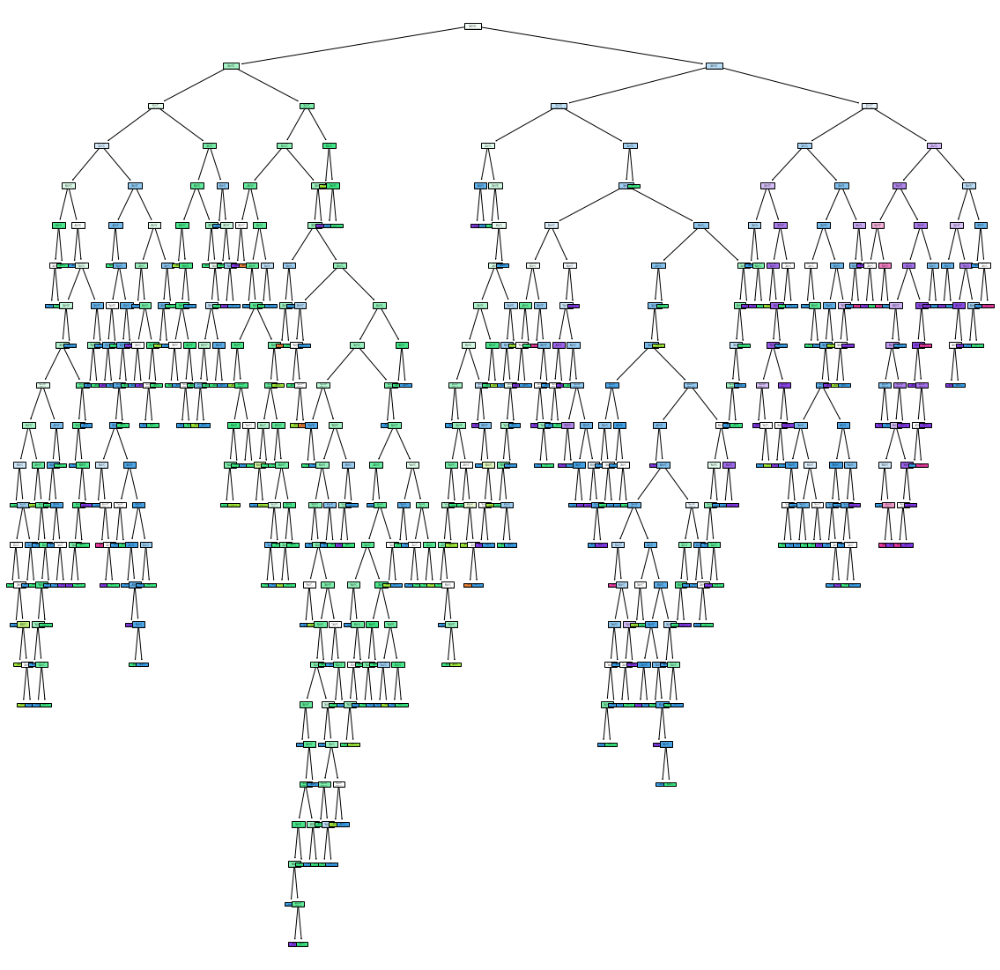

In [106]:
# Plotting tree
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model, filled=True)

In [107]:
# Splitting df to make clearer tree plot

In [108]:
df1= df.head(600)
x1 = df1.drop(columns='quality')
y1 = df1.quality

In [109]:
set(y1)

{3, 4, 5, 6, 7, 8}

In [110]:
df1

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
595,8.9,0.595,0.41,7.9,0.086,30.0,109.0,0.9998,3.27,0.57,9.3,5
596,12.4,0.400,0.51,2.0,0.059,6.0,24.0,0.9994,3.04,0.60,9.3,6
597,11.9,0.580,0.58,1.9,0.071,5.0,18.0,0.9980,3.09,0.63,10.0,6
598,8.5,0.585,0.18,2.1,0.078,5.0,30.0,0.9967,3.20,0.48,9.8,6


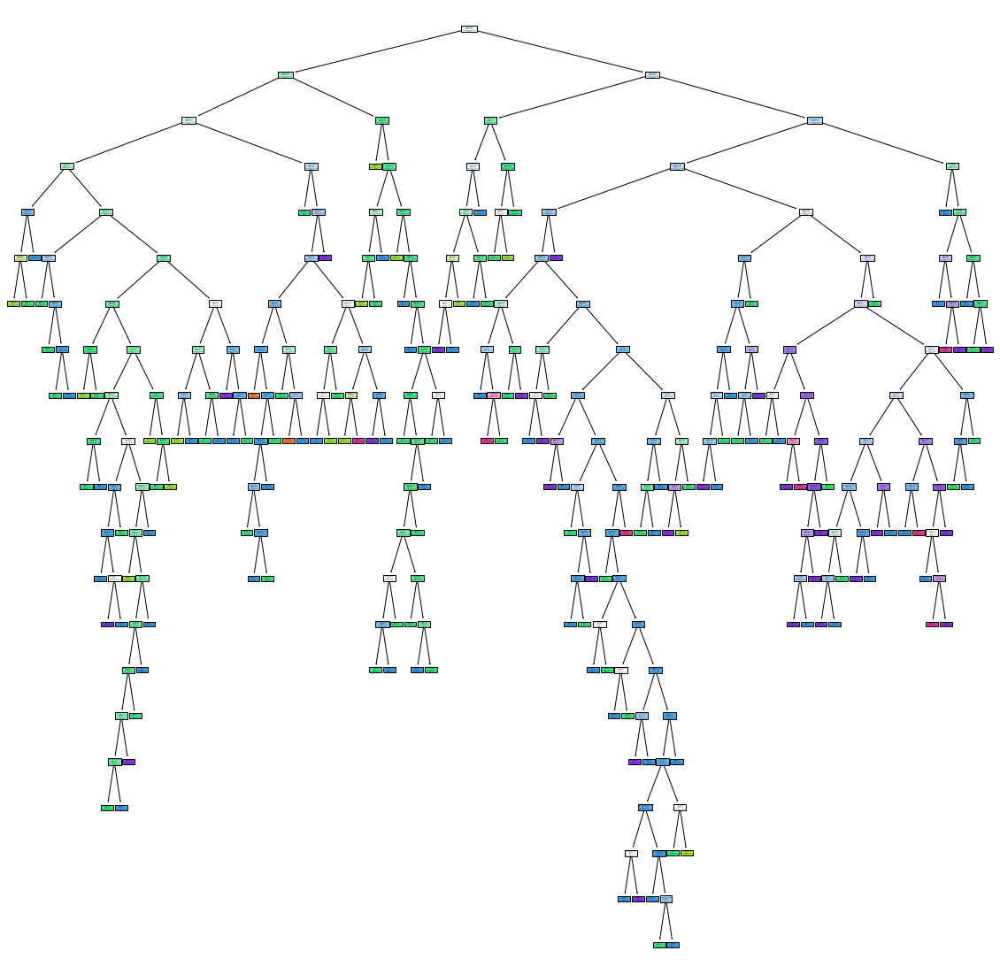

In [111]:
dt_model.fit(x1, y1)
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model, filled=True, class_names=[str(i) for i in set(y1)], feature_names=X.columns)

# Saving figure
plt.savefig('dt_model_1')

## Pruning - dealing with overfitting

In [112]:
dt_model.predict(x1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6, 5, 6, 5, 6, 5, 6, 6, 7, 4, 5, 5, 4, 6, 5,
       5, 4, 5, 5, 5, 5, 5, 6, 6, 5, 6, 5, 5, 5, 5, 6, 5, 5, 7, 5, 5, 5,
       5, 5, 5, 6, 6, 5, 5, 4, 5, 5, 5, 6, 5, 4, 5, 5, 5, 5, 6, 5, 6, 5,
       5, 5, 5, 6, 5, 5, 4, 6, 5, 5, 5, 6, 6, 6, 6, 5, 5, 5, 5, 5, 6, 5,
       5, 5, 5, 6, 5, 6, 6, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5, 5, 7, 5, 5, 5,
       5, 6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 6, 6, 4, 5, 5,
       5, 5, 5, 5, 5, 6, 5, 4, 6, 5, 5, 5, 5, 4, 6, 5, 4, 6, 6, 6, 5, 5,
       5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 6,
       7, 4, 7, 5, 5, 5, 6, 7, 7, 5, 5, 7, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5,
       6, 5, 5, 6, 4, 6, 6, 5, 6, 5, 7, 6, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6,
       6, 7, 7, 6, 5, 5, 6, 6, 6, 6, 5, 5, 6, 5, 5, 5, 5, 7, 5, 4, 5, 5,
       5, 7, 4, 8, 6, 6, 6, 6, 5, 5, 5, 6, 6, 6, 8, 7, 6, 7, 5, 7, 5, 5,
       6, 6, 7, 5, 7, 5, 6, 6, 6, 5, 5, 5, 5, 5, 6,

In [113]:
train_score = dt_model.score(x1, y1)
dt_model.score(x1, y1)

1.0

In [114]:
dt_model.score(X_test, y_test)

0.6625

Overfit. 

What can we do when dt is overfitting?

In [115]:
# Calculating cost of complexity
path = dt_model.cost_complexity_pruning_path(x1,y1)
path

{'ccp_alphas': array([0.        , 0.00148148, 0.00151515, 0.00155303, 0.00158333,
        0.00166667, 0.00166667, 0.00166667, 0.00166667, 0.00166667,
        0.00166667, 0.00166667, 0.00166667, 0.00166667, 0.00167907,
        0.00197531, 0.00198413, 0.00199567, 0.00208333, 0.00222222,
        0.00222222, 0.00222222, 0.00222222, 0.00222222, 0.00222222,
        0.00222222, 0.00222222, 0.00222222, 0.00222222, 0.00233631,
        0.0025    , 0.0025    , 0.0025    , 0.00251225, 0.00261905,
        0.00266667, 0.00267897, 0.0027037 , 0.00277778, 0.00277778,
        0.00277778, 0.00283333, 0.00284058, 0.002846  , 0.00285714,
        0.00287064, 0.00288172, 0.00296296, 0.00298246, 0.003     ,
        0.003     , 0.003     , 0.00303569, 0.00304459, 0.00305556,
        0.00307692, 0.00311111, 0.00311111, 0.00318841, 0.0034386 ,
        0.00346166, 0.00352941, 0.00374343, 0.00375   , 0.00398467,
        0.0040291 , 0.00405556, 0.00425926, 0.00427294, 0.00444444,
        0.00444444, 0.00444444, 0.

Default ccp_alpha value is 0. So the decision tree will be creating until the last split is performed (no other class is present in the node). 

In [116]:
ccp_alpha = path.ccp_alphas
ccp_alpha

array([0.        , 0.00148148, 0.00151515, 0.00155303, 0.00158333,
       0.00166667, 0.00166667, 0.00166667, 0.00166667, 0.00166667,
       0.00166667, 0.00166667, 0.00166667, 0.00166667, 0.00167907,
       0.00197531, 0.00198413, 0.00199567, 0.00208333, 0.00222222,
       0.00222222, 0.00222222, 0.00222222, 0.00222222, 0.00222222,
       0.00222222, 0.00222222, 0.00222222, 0.00222222, 0.00233631,
       0.0025    , 0.0025    , 0.0025    , 0.00251225, 0.00261905,
       0.00266667, 0.00267897, 0.0027037 , 0.00277778, 0.00277778,
       0.00277778, 0.00283333, 0.00284058, 0.002846  , 0.00285714,
       0.00287064, 0.00288172, 0.00296296, 0.00298246, 0.003     ,
       0.003     , 0.003     , 0.00303569, 0.00304459, 0.00305556,
       0.00307692, 0.00311111, 0.00311111, 0.00318841, 0.0034386 ,
       0.00346166, 0.00352941, 0.00374343, 0.00375   , 0.00398467,
       0.0040291 , 0.00405556, 0.00425926, 0.00427294, 0.00444444,
       0.00444444, 0.00444444, 0.00444444, 0.00447619, 0.0045 

In [117]:
dt_model2 = []
for ccp in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x1, y1)
    dt_model2.append(dt_m)

In [118]:
dt_model2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.0014814814814814814),
 DecisionTreeClassifier(ccp_alpha=0.0015151515151515154),
 DecisionTreeClassifier(ccp_alpha=0.0015530303030303028),
 DecisionTreeClassifier(ccp_alpha=0.0015833333333333329),
 DecisionTreeClassifier(ccp_alpha=0.0016666666666666668),
 DecisionTreeClassifier(ccp_alpha=0.0016666666666666668),
 DecisionTreeClassifier(ccp_alpha=0.0016666666666666668),
 DecisionTreeClassifier(ccp_alpha=0.0016666666666666668),
 DecisionTreeClassifier(ccp_alpha=0.0016666666666666668),
 DecisionTreeClassifier(ccp_alpha=0.0016666666666666668),
 DecisionTreeClassifier(ccp_alpha=0.0016666666666666668),
 DecisionTreeClassifier(ccp_alpha=0.0016666666666666668),
 DecisionTreeClassifier(ccp_alpha=0.0016666666666666668),
 DecisionTreeClassifier(ccp_alpha=0.0016790714159135207),
 DecisionTreeClassifier(ccp_alpha=0.0019753086419753087),
 DecisionTreeClassifier(ccp_alpha=0.0019841269841269836),
 DecisionTreeClassifier(ccp_alpha=0.001995670

In [119]:
# Calculating test_scores
test_score = []
for model in dt_model2:
    score = model.score(X_test, y_test)
    test_score.append(score)

In [120]:
test_score

[0.65625,
 0.653125,
 0.659375,
 0.653125,
 0.653125,
 0.675,
 0.659375,
 0.65625,
 0.6625,
 0.68125,
 0.65,
 0.65,
 0.66875,
 0.653125,
 0.66875,
 0.6625,
 0.66875,
 0.678125,
 0.66875,
 0.671875,
 0.678125,
 0.65625,
 0.671875,
 0.665625,
 0.6875,
 0.6625,
 0.671875,
 0.665625,
 0.659375,
 0.665625,
 0.671875,
 0.671875,
 0.665625,
 0.6625,
 0.675,
 0.675,
 0.65625,
 0.653125,
 0.678125,
 0.65,
 0.640625,
 0.6375,
 0.6375,
 0.634375,
 0.6375,
 0.665625,
 0.64375,
 0.65,
 0.64375,
 0.634375,
 0.6625,
 0.634375,
 0.63125,
 0.65,
 0.653125,
 0.65625,
 0.66875,
 0.675,
 0.659375,
 0.65,
 0.640625,
 0.640625,
 0.653125,
 0.65,
 0.646875,
 0.653125,
 0.65625,
 0.65625,
 0.646875,
 0.646875,
 0.65,
 0.646875,
 0.65,
 0.65,
 0.65,
 0.63125,
 0.625,
 0.621875,
 0.625,
 0.61875,
 0.61875,
 0.6125,
 0.6125,
 0.609375,
 0.584375,
 0.578125,
 0.575,
 0.575,
 0.571875,
 0.56875,
 0.55,
 0.546875,
 0.546875,
 0.54375,
 0.553125,
 0.55,
 0.55,
 0.540625,
 0.540625,
 0.540625,
 0.4125]

In [121]:
# Train scores
train_score = [i.score(x1,y1) for i in dt_model2]
train_score

[1.0,
 0.9983333333333333,
 0.9966666666666667,
 0.9933333333333333,
 0.9916666666666667,
 0.975,
 0.975,
 0.9783333333333334,
 0.9766666666666667,
 0.9783333333333334,
 0.9783333333333334,
 0.9766666666666667,
 0.975,
 0.975,
 0.9733333333333334,
 0.97,
 0.9683333333333334,
 0.9583333333333334,
 0.9583333333333334,
 0.94,
 0.9383333333333334,
 0.94,
 0.94,
 0.9416666666666667,
 0.9383333333333334,
 0.94,
 0.94,
 0.94,
 0.9416666666666667,
 0.9366666666666666,
 0.935,
 0.9316666666666666,
 0.9316666666666666,
 0.9333333333333333,
 0.9283333333333333,
 0.925,
 0.925,
 0.9233333333333333,
 0.9166666666666666,
 0.9183333333333333,
 0.9183333333333333,
 0.915,
 0.91,
 0.91,
 0.9066666666666666,
 0.905,
 0.8983333333333333,
 0.8966666666666666,
 0.8916666666666667,
 0.89,
 0.8883333333333333,
 0.8883333333333333,
 0.885,
 0.8816666666666667,
 0.8783333333333333,
 0.8766666666666667,
 0.8716666666666667,
 0.8716666666666667,
 0.87,
 0.87,
 0.8616666666666667,
 0.8583333333333333,
 0.85166666

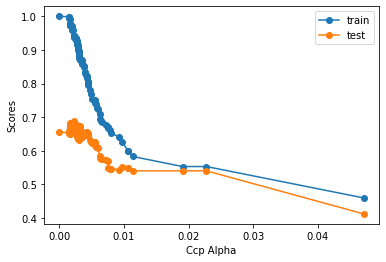

In [122]:
# Train scores vs. Test score
fig, ax = plt.subplots()
ax.plot(ccp_alpha, train_score, marker='o', label='train')
ax.plot(ccp_alpha, test_score, marker='o', label='test')
ax.set_xlabel('Ccp Alpha')
ax.set_ylabel('Scores')
plt.legend()

Upon feeding more data to the model we will receive more robust model.
Betweem ccp_alpha value 0.02 and 0.04 the score of train and test are coming closer. 

Building new model with new values of the ccp. 

[Text(669.5999999999999, 906.0, 'X[10] <= 9.85\ngini = 0.629\nsamples = 600\nvalue = [2, 18, 276, 229, 66, 9]'),
 Text(446.4, 543.6, 'X[6] <= 62.5\ngini = 0.509\nsamples = 299\nvalue = [2, 13, 190, 87, 6, 1]'),
 Text(223.2, 181.19999999999993, 'gini = 0.58\nsamples = 196\nvalue = [2, 10, 101, 76, 6, 1]'),
 Text(669.5999999999999, 181.19999999999993, 'gini = 0.241\nsamples = 103\nvalue = [0, 3, 89, 11, 0, 0]'),
 Text(892.8, 543.6, 'gini = 0.655\nsamples = 301\nvalue = [0, 5, 86, 142, 60, 8]')]

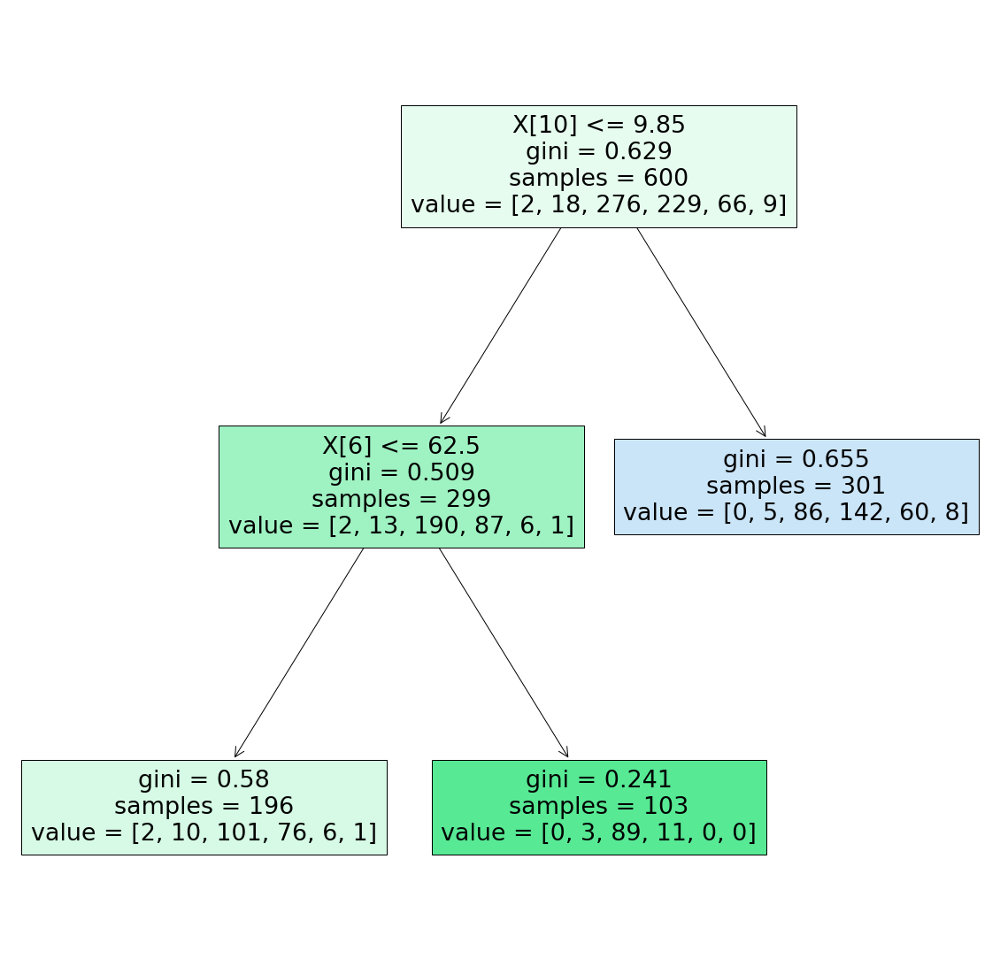

In [123]:
# New model with updated ccp value
dt_model_ccp = DecisionTreeClassifier(random_state=0, ccp_alpha=0.02)
dt_model_ccp.fit(x1, y1)
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp, filled=True)

In [124]:
dt_model_ccp.score(X_test, y_test), dt_model_ccp.score(x1, y1)

(0.540625, 0.5533333333333333)

The overfit is dealt with. Scores of training and test are similiar. 

### Continue with hyperparameter tuning with GridSeachCV

In [125]:
# Creating dictionary for hyperparameter search
grid_pram = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': range(2,40,1),
    'min_samples_split': range(2,10,1),
    'min_samples_leaf': range(1,10,1)
}

In [126]:
grid_ccp = GridSearchCV(estimator=dt_model_ccp, param_grid=grid_pram, cv=5)
grid_ccp.fit(x1,y1)

GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(ccp_alpha=0.02, random_state=0),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [127]:
grid_ccp.best_params_

{'criterion': 'entropy',
 'max_depth': 4,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'splitter': 'best'}

In [128]:
dt_ccp_new = DecisionTreeClassifier(criterion='entropy', max_depth=4, min_samples_leaf=1, min_impurity_split=2, splitter='best')

In [129]:
dt_ccp_new.fit(x1,y1)

DecisionTreeClassifier(criterion='entropy', max_depth=4, min_impurity_split=2)

In [130]:
dt_ccp_new.score(x1,y1)

0.46

In [131]:
dt_ccp_new.score(X_test, y_test)

0.4125

In [132]:
pred = dt_ccp_new.predict(X_train)
confusion_matrix(y_train, pred)

array([[  0,   0,   5,   0,   0,   0],
       [  0,   0,  43,   0,   0,   0],
       [  0,   0, 549,   0,   0,   0],
       [  0,   0, 513,   0,   0,   0],
       [  0,   0, 153,   0,   0,   0],
       [  0,   0,  16,   0,   0,   0]], dtype=int64)

### Bagging Classifier and Random Forest Classifier

In [136]:
from sklearn.ensemble import BaggingClassifier

With the help of the Bagging Classifier we can create Bagging Algorithm with any algorithm as a base. 

In [138]:
# Bagging Classifier with DecisionTree as base algo and 10 trees
bag_dt = BaggingClassifier(DecisionTreeClassifier(), n_estimators=10)
bag_dt.fit(X_train, y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier())

In [139]:
bag_dt.predict(X_test)

array([5, 6, 5, 6, 6, 5, 6, 5, 5, 6, 4, 6, 5, 6, 5, 6, 6, 6, 4, 6, 6, 6,
       6, 6, 7, 5, 4, 6, 6, 5, 6, 7, 6, 5, 6, 5, 6, 5, 5, 5, 5, 5, 6, 5,
       6, 5, 5, 6, 6, 6, 6, 5, 5, 5, 5, 6, 7, 5, 6, 6, 6, 6, 6, 6, 6, 6,
       5, 5, 4, 6, 6, 5, 6, 7, 6, 5, 5, 5, 6, 5, 5, 5, 6, 6, 8, 5, 5, 5,
       6, 4, 5, 5, 6, 7, 5, 5, 7, 6, 5, 6, 7, 5, 6, 5, 5, 7, 5, 5, 5, 7,
       5, 5, 5, 5, 5, 6, 7, 5, 6, 5, 6, 5, 6, 6, 6, 7, 6, 5, 6, 6, 5, 5,
       5, 5, 6, 6, 6, 7, 5, 5, 6, 5, 6, 5, 6, 6, 6, 5, 6, 5, 5, 7, 7, 5,
       6, 6, 6, 6, 5, 6, 5, 5, 6, 6, 5, 6, 6, 5, 6, 6, 7, 6, 6, 6, 6, 7,
       5, 6, 5, 5, 5, 6, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5, 6, 5, 6, 5, 6, 6,
       6, 5, 6, 6, 6, 5, 6, 6, 5, 6, 5, 5, 6, 6, 7, 5, 6, 6, 6, 7, 5, 6,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 5, 7, 6, 5, 6, 5, 6, 6, 6, 5,
       5, 6, 7, 5, 5, 5, 5, 6, 7, 5, 6, 6, 6, 7, 6, 6, 6, 7, 6, 6, 5, 6,
       6, 6, 6, 5, 6, 4, 5, 7, 5, 6, 5, 5, 5, 6, 5, 7, 6, 5, 5, 6, 5, 5,
       6, 5, 6, 5, 6, 5, 5, 5, 7, 7, 5, 6, 5, 6, 5,

In [140]:
# Calling the base estimator
bag_dt.base_estimator_

DecisionTreeClassifier()

In [141]:
bag_dt.classes_ # Checking classes

array([3, 4, 5, 6, 7, 8], dtype=int64)

In [142]:
# Different base - importing KNN to call it as a base
from sklearn.neighbors import KNeighborsClassifier

bag_knn = BaggingClassifier(KNeighborsClassifier(6), n_estimators=10)
bag_knn.fit(X_train, y_train)
bag_knn.predict(X_test)

array([6, 6, 5, 5, 5, 6, 6, 6, 6, 6, 6, 5, 5, 6, 5, 7, 7, 6, 5, 5, 5, 6,
       5, 5, 7, 6, 6, 5, 7, 5, 5, 7, 6, 6, 7, 5, 5, 5, 7, 6, 6, 6, 5, 5,
       7, 5, 5, 5, 6, 6, 6, 6, 5, 5, 6, 5, 7, 7, 6, 5, 5, 5, 6, 6, 7, 6,
       5, 5, 6, 6, 6, 5, 6, 5, 5, 5, 7, 5, 6, 6, 6, 5, 6, 7, 8, 5, 5, 6,
       5, 6, 6, 6, 5, 6, 5, 5, 6, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 5, 6, 6,
       6, 6, 5, 5, 5, 6, 6, 6, 6, 5, 5, 6, 5, 6, 5, 7, 5, 5, 6, 5, 5, 5,
       5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 7, 6, 5,
       5, 5, 5, 6, 5, 5, 5, 5, 7, 5, 6, 5, 6, 5, 6, 6, 7, 6, 6, 6, 5, 6,
       6, 5, 5, 5, 6, 5, 5, 5, 5, 5, 6, 5, 5, 6, 5, 5, 6, 6, 6, 5, 6, 5,
       6, 5, 6, 6, 5, 5, 6, 7, 5, 6, 5, 5, 5, 6, 7, 5, 6, 6, 5, 6, 5, 7,
       5, 5, 5, 6, 6, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 5, 5, 5, 6, 6, 5, 5,
       6, 6, 7, 6, 5, 5, 5, 6, 6, 5, 5, 6, 5, 6, 6, 6, 6, 7, 6, 5, 6, 6,
       6, 7, 5, 6, 6, 5, 5, 7, 5, 6, 5, 5, 5, 5, 5, 8, 5, 5, 5, 6, 6, 5,
       5, 5, 6, 6, 5, 5, 6, 5, 6, 6, 5, 6, 6, 4, 5,

In [144]:
# Random Forest
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()
rf.fit(X_train, y_train)
rf.predict(X_test)

array([5, 6, 5, 5, 6, 5, 6, 5, 5, 6, 5, 5, 5, 6, 5, 6, 6, 6, 4, 5, 6, 7,
       5, 6, 7, 6, 5, 5, 6, 5, 5, 7, 6, 5, 6, 5, 5, 5, 5, 5, 5, 5, 6, 6,
       6, 5, 5, 6, 6, 5, 6, 5, 5, 5, 5, 6, 7, 5, 6, 6, 6, 6, 6, 7, 6, 6,
       6, 5, 5, 6, 6, 5, 6, 6, 6, 5, 6, 5, 6, 5, 5, 5, 6, 6, 6, 6, 5, 5,
       6, 5, 6, 5, 5, 6, 5, 5, 7, 6, 5, 6, 7, 5, 6, 6, 5, 7, 5, 5, 5, 7,
       5, 5, 5, 5, 5, 6, 6, 5, 6, 5, 6, 5, 6, 6, 6, 7, 6, 5, 6, 6, 5, 6,
       5, 5, 6, 6, 6, 6, 5, 5, 6, 5, 6, 5, 6, 6, 6, 5, 6, 5, 5, 7, 7, 5,
       6, 6, 6, 6, 5, 6, 5, 6, 6, 6, 5, 6, 6, 5, 7, 6, 7, 6, 6, 7, 6, 7,
       5, 5, 5, 5, 5, 6, 6, 6, 6, 5, 6, 6, 5, 5, 5, 5, 6, 5, 5, 5, 6, 6,
       6, 5, 6, 6, 5, 5, 7, 6, 5, 6, 6, 5, 5, 6, 7, 5, 5, 6, 6, 7, 5, 6,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 5, 7, 6, 5, 6, 5, 6, 6, 6, 5,
       5, 6, 7, 5, 5, 5, 5, 5, 7, 5, 6, 6, 5, 6, 7, 6, 6, 7, 6, 6, 5, 5,
       6, 6, 6, 5, 7, 4, 5, 6, 5, 6, 6, 5, 5, 6, 5, 6, 6, 5, 5, 6, 6, 5,
       5, 6, 6, 5, 5, 5, 6, 5, 6, 6, 5, 6, 5, 6, 5,

In [145]:
# Scores
bag_dt.score(X_test, y_test), bag_knn.score(X_test, y_test), rf.score(X_test, y_test)

(0.6375, 0.465625, 0.690625)

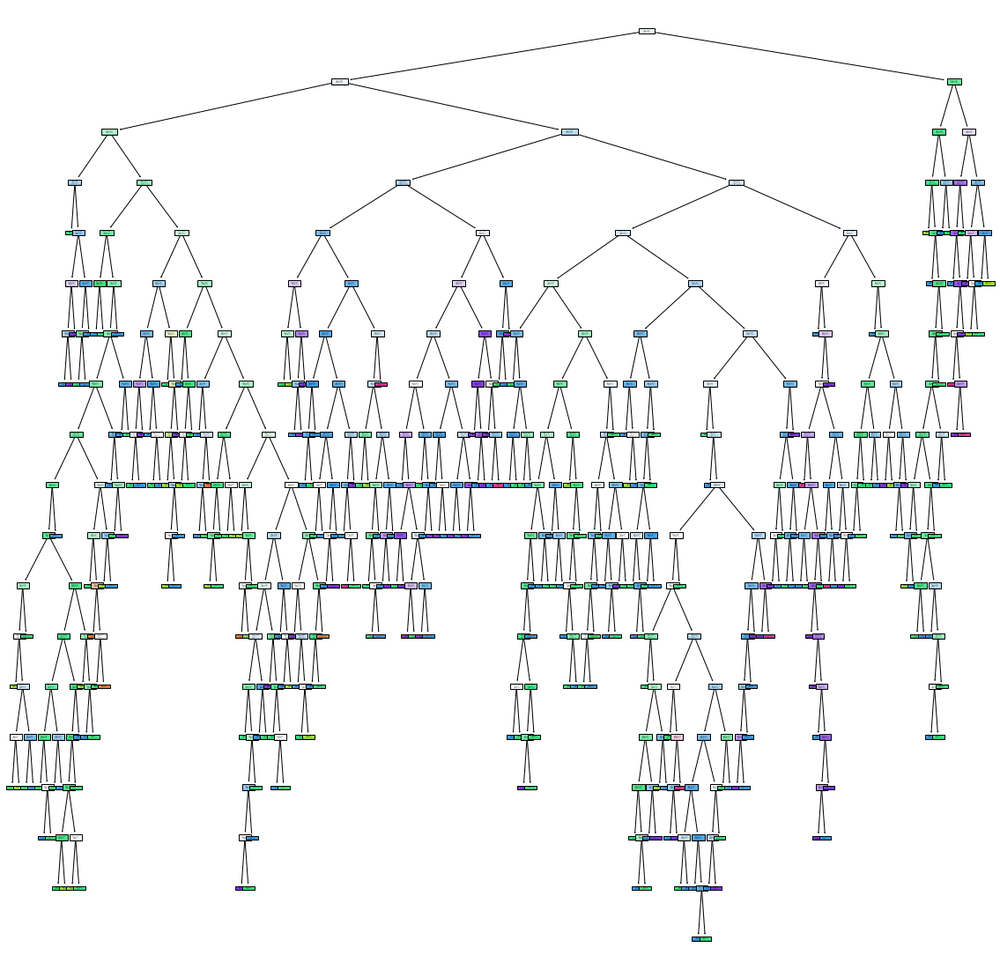

In [150]:
# Plotting trees
estimators = rf.estimators_
plt.figure(figsize=(20,20))
for e in range(len(estimators[:3])):
    tree.plot_tree(estimators[e], filled=True)

In [157]:
# Grid Search
l = list(np.random.randint(5, 150, 6))
grid_params = {
    'n_estimators': l,
    'criterion': ['gini', 'entropy'],
    'max_depth': range(10),
    'min_samples_leaf': range(10),
}

In [158]:
rf = RandomForestClassifier(n_estimators=-2)
gs_rf = GridSearchCV(param_grid=grid_params, estimator=rf, cv=10, verbose=1)

In [159]:
#gs_rf.fit(X_train, y_train)

Fitting 10 folds for each of 1200 candidates, totalling 12000 fits


GridSearchCV(cv=10, estimator=RandomForestClassifier(n_estimators=-2),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(0, 10),
                         'min_samples_leaf': range(0, 10),
                         'n_estimators': [85, 48, 24, 44, 11, 117]},
             verbose=1)

In [160]:
gs_rf.best_estimator_

RandomForestClassifier(max_depth=9, min_samples_leaf=2, n_estimators=85)

In [161]:
gs_rf.best_params_

{'criterion': 'gini',
 'max_depth': 9,
 'min_samples_leaf': 2,
 'n_estimators': 85}

In [162]:
rf_new = RandomForestClassifier(criterion='gini', max_depth=9, min_samples_leaf=2, n_estimators=85)
rf_new.fit(X_train, y_train)
rf_new.score(X_test, y_test)

0.65

[Text(759.8356299212599, 1032.8400000000001, 'X[6] <= 79.5\ngini = 0.636\nsamples = 806\nvalue = [6, 37, 551, 516, 155, 14]'),
 Text(477.08267716535437, 924.1200000000001, 'X[10] <= 10.525\ngini = 0.639\nsamples = 686\nvalue = [6, 31, 404, 481, 138, 12]'),
 Text(226.27559055118112, 815.4000000000001, 'X[2] <= 0.295\ngini = 0.559\nsamples = 379\nvalue = [5, 16, 322, 239, 22, 1]'),
 Text(139.13385826771653, 706.6800000000001, 'X[1] <= 0.548\ngini = 0.514\nsamples = 235\nvalue = [4, 9, 232, 121, 10, 0]'),
 Text(86.40944881889764, 597.96, 'X[7] <= 0.997\ngini = 0.511\nsamples = 76\nvalue = [0, 1, 50, 63, 1, 0]'),
 Text(67.37007874015748, 489.24, 'X[7] <= 0.997\ngini = 0.506\nsamples = 56\nvalue = [0, 0, 48, 39, 1, 0]'),
 Text(46.86614173228347, 380.5200000000001, 'X[2] <= 0.07\ngini = 0.513\nsamples = 50\nvalue = [0, 0, 38, 38, 1, 0]'),
 Text(23.433070866141733, 271.80000000000007, 'X[5] <= 14.0\ngini = 0.245\nsamples = 12\nvalue = [0, 0, 3, 18, 0, 0]'),
 Text(11.716535433070867, 163.08000

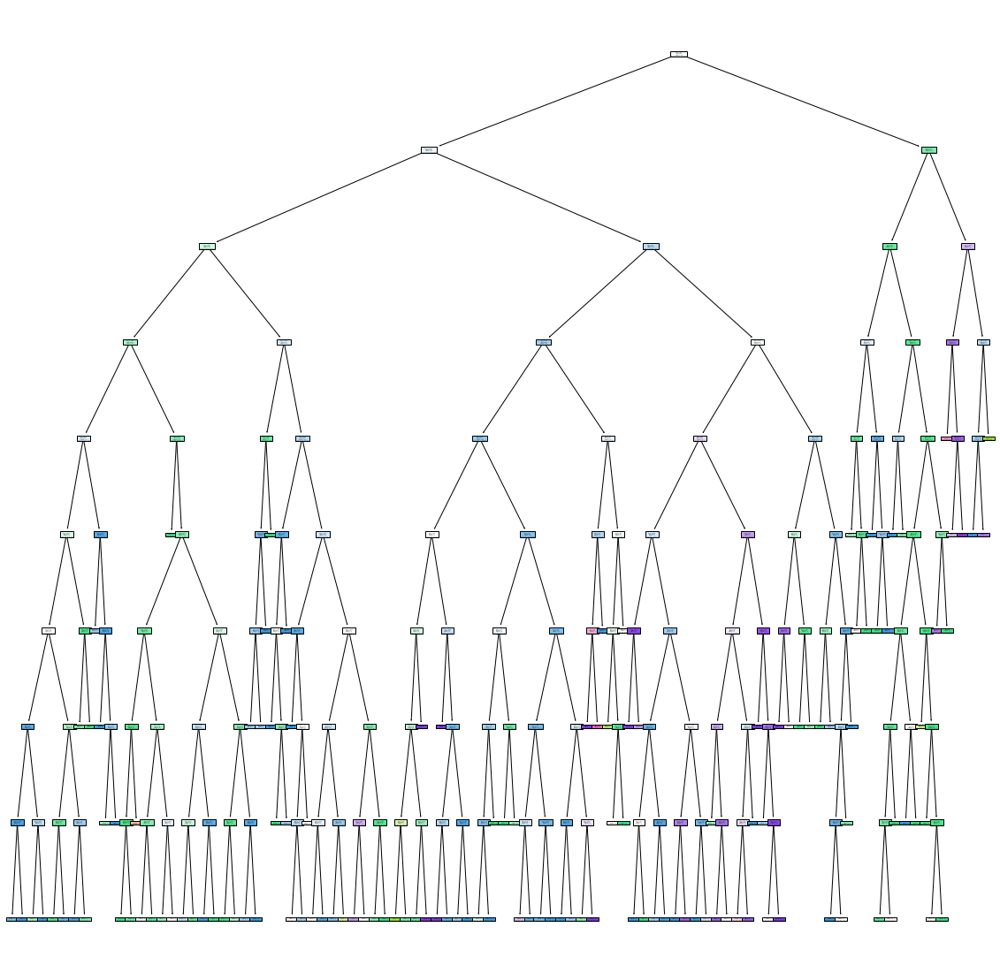

In [164]:
plt.figure(figsize=(20,20))
tree.plot_tree(rf_new.estimators_[0], filled=True)